# Import the packages

In [2]:
import scanpy as sc
import pandas as pd
from matplotlib.pyplot import rc_context
import anndata
import numpy as np
import os
from datetime import date
import scipy
import gc
gc.enable()

In [3]:
gc.isenabled()

True

In [5]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white',figsize=(5,5))

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.24.3 scipy==1.10.1 pandas==2.0.1 scikit-learn==1.2.2 statsmodels==0.14.0 python-igraph==0.10.4 pynndescent==0.5.10


# Load the data

In [1]:
# this data is available here : http://ftp.ebi.ac.uk/pub/databases/microarray/data/atlas/sc_experiments/E-MTAB-10519/

In [ ]:
fdata_b = sc.read_h5ad('E-MTAB-10519.project.h5ad')

In [10]:
fdata_b

AnnData object with n_obs × n_vars = 527530 × 14078
    obs: 'age', 'cell_type', 'developmental_stage', 'genotype', 'organism_part', 'organism', 'sex', 'strain', 'authors_cell_type_-_ontology_labels', 'authors_cell_type', 'cell_type.1', 'organism_part.1', 'age_ontology', 'cell_type_ontology', 'developmental_stage_ontology', 'genotype_ontology', 'organism_part_ontology', 'organism_ontology', 'sex_ontology', 'strain_ontology', 'authors_cell_type_-_ontology_labels_ontology', 'authors_cell_type_ontology', 'cell_type_ontology.1', 'organism_part_ontology.1', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'n_counts', 'n_genes', 'louvain_resolution_0.1', 'louvain_resolution_0.3', 'louvain_resolution_0.5', 'louvain_resolution_0.7', 'louvain_resolution_1.0', 'louvain_resolution_2.0', 'louvain_resolution_3.0', 'louvain_resolution_4.0', 'louvain_resolution

In [11]:
#### Gives the raw file of only the part we need 
fdata_b[fdata_b.obs.organism_part == 'head', :]

View of AnnData object with n_obs × n_vars = 60351 × 14078
    obs: 'age', 'cell_type', 'developmental_stage', 'genotype', 'organism_part', 'organism', 'sex', 'strain', 'authors_cell_type_-_ontology_labels', 'authors_cell_type', 'cell_type.1', 'organism_part.1', 'age_ontology', 'cell_type_ontology', 'developmental_stage_ontology', 'genotype_ontology', 'organism_part_ontology', 'organism_ontology', 'sex_ontology', 'strain_ontology', 'authors_cell_type_-_ontology_labels_ontology', 'authors_cell_type_ontology', 'cell_type_ontology.1', 'organism_part_ontology.1', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'n_counts', 'n_genes', 'louvain_resolution_0.1', 'louvain_resolution_0.3', 'louvain_resolution_0.5', 'louvain_resolution_0.7', 'louvain_resolution_1.0', 'louvain_resolution_2.0', 'louvain_resolution_3.0', 'louvain_resolution_4.0', 'louvain_res

In [11]:
fdata_b[fdata_b.obs.organism_part == 'head', :].obs

,age,cell_type,developmental_stage,genotype,organism_part,organism,sex,strain,authors_cell_type_-_ontology_labels,authors_cell_type,...,n_genes,louvain_resolution_0.1,louvain_resolution_0.3,louvain_resolution_0.5,louvain_resolution_0.7,louvain_resolution_1.0,louvain_resolution_2.0,louvain_resolution_3.0,louvain_resolution_4.0,louvain_resolution_5.0
SAMEA9135834-GTAGTACTCCCGAGAC,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,NaN,NaN,...,3914,2,15,16,16,17,29,32,33,34
SAMEA9135834-GAGGCAAAGCTCGACC,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,NaN,NaN,...,3858,2,15,16,16,17,29,32,33,34
SAMEA9135834-CAAAGAATCAGCTGAT,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,NaN,NaN,...,3533,2,15,16,16,17,29,32,33,34
SAMEA9135834-CCACACTGTGTGTTTG,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,NaN,NaN,...,3976,2,15,16,16,17,29,32,33,34
SAMEA9135834-GCAACCGTCAAGGTGG,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,NaN,NaN,...,4117,2,15,16,16,17,29,32,33,34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SAMEA9135832-AAGCATCAGCCATTTG,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,male,w1118,NaN,NaN,...,668,1,7,11,12,13,9,29,47,57
SAMEA9135832-TGAATGCTCACCGGGT,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,male,w1118,NaN,NaN,...,638,1,7,11,12,13,9,29,47,57
SAMEA9135832-CATCGCTGTCCCTAAA,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,male,w1118,NaN,NaN,...,585,1,7,11,12,13,9,29,47,57
SAMEA9135832-AACGAAACAAAGACGC,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,male,w1118,NaN,NaN,...,557,1,7,11,12,13,9,29,47,57


In [12]:
fdata_b[fdata_b.obs.organism_part == 'head', :].obs['authors_cell_type_-_ontology_labels'].unique()

[NaN, 'ensheathing glial cell', 'epithelial cell', 'cone cell', 'columnar neuron T1', ..., 'cell body glial cell', 'perineurial glial cell', 'transmedullary neuron Tm20', 'adult lobula astrocyte-like glial cell', 'antennal olfactory receptor neuron of trichoi...]
Length: 80
Categories (79, object): ['Johnston organ neuron', 'Kenyon cell', 'T neuron', 'T neuron T2', ..., 'transmedullary neuron Tm5c', 'transmedullary neuron Tm9', 'transmedullary neuron Tm20', 'transmedullary neuron Tm29']

In [13]:
fdata_b[fdata_b.obs.organism_part == 'head', :].obs['authors_cell_type'].unique()

[NaN, 'ensheathing glial cell', 'epithelial cell', 'cone cell', 'columnar neuron T1', ..., 'transmedullary neuron Tm20', 'lamina monopolar neuron L4', 'lamina monopolar neuron L5', 'adult lobula astrocyte-like glial cell', 'antennal trichoid sensillum at4']
Length: 82
Categories (81, object): ['Johnston organ neuron', 'Kenyon cell', 'Poxn neuron', 'T neuron T2', ..., 'transmedullary neuron Tm5c', 'transmedullary neuron Tm9', 'transmedullary neuron Tm20', 'transmedullary neuron Tm29']

In [14]:
sum(fdata_b[fdata_b.obs.organism_part == 'head', :].obs['authors_cell_type'].isna())

37019

In [15]:
fdata_b[fdata_b.obs.organism_part == 'head', :].raw.X.max()

3206.963

In [16]:
np.shape(fdata_b[fdata_b.obs.organism_part == 'head', :].raw.X)

(60351, 14094)

In [17]:
fdata_b.X #the values are scaled

array([[ 3.2895687 , -0.11256056,  1.5985433 , ..., -0.35991484,
        -0.06871849, -0.02549076],
       [ 2.2431085 , -0.11256056,  1.9964205 , ..., -0.35991484,
        -0.06871849, -0.02549076],
       [ 3.4946961 , -0.11256056,  1.5113559 , ..., -0.35991484,
        -0.06871849, -0.02549076],
       ...,
       [ 6.5619397 , -0.11256056, -0.39713016, ..., -0.35991484,
        -0.06871849, -0.02549076],
       [ 6.490627  , -0.11256056, -0.39713016, ..., -0.35991484,
        -0.06871849, -0.02549076],
       [ 6.527985  , -0.11256056, -0.39713016, ..., -0.35991484,
        -0.06871849, -0.02549076]], dtype=float32)

In [18]:
fdata_b.raw.X.max() #seems like there are the original counts in the raw file

50438.637

In [19]:
fdata_b.obs

,age,cell_type,developmental_stage,genotype,organism_part,organism,sex,strain,authors_cell_type_-_ontology_labels,authors_cell_type,...,n_genes,louvain_resolution_0.1,louvain_resolution_0.3,louvain_resolution_0.5,louvain_resolution_0.7,louvain_resolution_1.0,louvain_resolution_2.0,louvain_resolution_3.0,louvain_resolution_4.0,louvain_resolution_5.0
SAMEA9135848-TGCATCCCACGCACCA,5 day,NaN,adult,wild type genotype,body,Drosophila melanogaster,female,w1118,neuron,adult ventral nervous system,...,6407,1,1,10,9,42,54,79,84,98
SAMEA9135848-TGTTTGTCAAAGTATG,5 day,NaN,adult,wild type genotype,body,Drosophila melanogaster,female,w1118,germline cell,germline cell,...,6205,1,7,11,12,9,9,29,47,57
SAMEA9135848-GTAGGAGGTCTAGGTT,5 day,NaN,adult,wild type genotype,body,Drosophila melanogaster,female,w1118,NaN,NaN,...,6615,3,1,21,22,33,49,72,72,82
SAMEA9135848-CCGGACAAGTTGAATG,5 day,NaN,adult,wild type genotype,body,Drosophila melanogaster,female,w1118,neuron,adult ventral nervous system,...,5806,2,1,14,14,14,16,28,26,29
SAMEA9135848-AATGACCAGTGGTGAC,5 day,NaN,adult,wild type genotype,body,Drosophila melanogaster,female,w1118,follicle cell,follicle cell,...,6325,1,1,10,9,42,54,79,84,98
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SAMEA9135986-GAGTATATCTCGGGAC,5 day,NaN,adult,wild type genotype,wing,Drosophila melanogaster,female,w1118,NaN,NaN,...,525,8,8,8,6,16,19,24,24,25
SAMEA9135986-ATCATGCCACTCCTGT,5 day,NaN,adult,wild type genotype,wing,Drosophila melanogaster,female,w1118,NaN,NaN,...,533,8,8,8,6,16,19,24,24,25
SAMEA9135986-CAAGCTCAGCCGAATG,5 day,NaN,adult,wild type genotype,wing,Drosophila melanogaster,female,w1118,NaN,NaN,...,539,8,8,8,6,16,19,24,24,25
SAMEA9135986-TTGTGATGTGAGTAAT,5 day,NaN,adult,wild type genotype,wing,Drosophila melanogaster,female,w1118,NaN,NaN,...,552,8,8,8,6,16,19,24,24,25


In [21]:
fdata_b.obs.shape[0]

527530

In [22]:
fdata_b.var_names

Index(['FBgn0250732', 'FBgn0037409', 'FBgn0027948', 'FBgn0038675',
       'FBgn0000500', 'FBgn0037610', 'FBgn0053095', 'FBgn0038070',
       'FBgn0261859', 'FBgn0037363',
       ...
       'FBgn0267509', 'FBgn0267511', 'FBgn0085753', 'FBgn0085692',
       'FBgn0267594', 'FBgn0267596', 'FBgn0259817', 'FBgn0085494',
       'FBgn0267595', 'FBgn0085506'],
      dtype='object', length=14078)

In [23]:
np.shape(fdata_b.raw.X)

(527530, 14094)

In [24]:
type(fdata_b.raw.X)

scipy.sparse._csr.csr_matrix

# Get only the head

In [25]:
fdata = fdata_b[fdata_b.obs.organism_part == 'head', :]

In [26]:
fdata

View of AnnData object with n_obs × n_vars = 60351 × 14078
    obs: 'age', 'cell_type', 'developmental_stage', 'genotype', 'organism_part', 'organism', 'sex', 'strain', 'authors_cell_type_-_ontology_labels', 'authors_cell_type', 'cell_type.1', 'organism_part.1', 'age_ontology', 'cell_type_ontology', 'developmental_stage_ontology', 'genotype_ontology', 'organism_part_ontology', 'organism_ontology', 'sex_ontology', 'strain_ontology', 'authors_cell_type_-_ontology_labels_ontology', 'authors_cell_type_ontology', 'cell_type_ontology.1', 'organism_part_ontology.1', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'n_counts', 'n_genes', 'louvain_resolution_0.1', 'louvain_resolution_0.3', 'louvain_resolution_0.5', 'louvain_resolution_0.7', 'louvain_resolution_1.0', 'louvain_resolution_2.0', 'louvain_resolution_3.0', 'louvain_resolution_4.0', 'louvain_res

In [27]:
fdata.obs_names

Index(['SAMEA9135834-GTAGTACTCCCGAGAC', 'SAMEA9135834-GAGGCAAAGCTCGACC',
       'SAMEA9135834-CAAAGAATCAGCTGAT', 'SAMEA9135834-CCACACTGTGTGTTTG',
       'SAMEA9135834-GCAACCGTCAAGGTGG', 'SAMEA9135834-TCCCAGTAGCGCCTTG',
       'SAMEA9135834-CTAACCCAGCGCAATG', 'SAMEA9135834-TAGACTGAGTATGGCG',
       'SAMEA9135834-TACACCCCAGCTGCCA', 'SAMEA9135834-CATACAGGTATTGCCA',
       ...
       'SAMEA9135832-GATCATGGTTGGCCTG', 'SAMEA9135832-TGCCGAGAGGAGTATT',
       'SAMEA9135832-ACACAGTGTCATAGTC', 'SAMEA9135832-AACAAGAGTCCCGCAA',
       'SAMEA9135832-CATCGTCCAAGCAATA', 'SAMEA9135832-AAGCATCAGCCATTTG',
       'SAMEA9135832-TGAATGCTCACCGGGT', 'SAMEA9135832-CATCGCTGTCCCTAAA',
       'SAMEA9135832-AACGAAACAAAGACGC', 'SAMEA9135832-TGTTACTTCGTTTACT'],
      dtype='object', length=60351)

In [28]:
fdata.X

ArrayView([[-0.19194509, -0.11256056,  1.8560624 , ..., -0.35991484,
            -0.06871849, -0.02549076],
           [-0.19194509, -0.11256056, -0.39713016, ..., -0.35991484,
            -0.06871849, -0.02549076],
           [-0.19194509, -0.11256056,  2.0462196 , ..., -0.35991484,
            -0.06871849, -0.02549076],
           ...,
           [-0.19194509, -0.11256056, -0.39713016, ..., -0.35991484,
            -0.06871849, -0.02549076],
           [-0.19194509, -0.11256056,  3.0754905 , ..., -0.35991484,
            -0.06871849, -0.02549076],
           [-0.19194509, -0.11256056, -0.39713016, ..., -0.35991484,
            -0.06871849, -0.02549076]], dtype=float32)

In [29]:
fdata.obs

,age,cell_type,developmental_stage,genotype,organism_part,organism,sex,strain,authors_cell_type_-_ontology_labels,authors_cell_type,...,n_genes,louvain_resolution_0.1,louvain_resolution_0.3,louvain_resolution_0.5,louvain_resolution_0.7,louvain_resolution_1.0,louvain_resolution_2.0,louvain_resolution_3.0,louvain_resolution_4.0,louvain_resolution_5.0
SAMEA9135834-GTAGTACTCCCGAGAC,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,NaN,NaN,...,3914,2,15,16,16,17,29,32,33,34
SAMEA9135834-GAGGCAAAGCTCGACC,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,NaN,NaN,...,3858,2,15,16,16,17,29,32,33,34
SAMEA9135834-CAAAGAATCAGCTGAT,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,NaN,NaN,...,3533,2,15,16,16,17,29,32,33,34
SAMEA9135834-CCACACTGTGTGTTTG,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,NaN,NaN,...,3976,2,15,16,16,17,29,32,33,34
SAMEA9135834-GCAACCGTCAAGGTGG,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,NaN,NaN,...,4117,2,15,16,16,17,29,32,33,34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SAMEA9135832-AAGCATCAGCCATTTG,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,male,w1118,NaN,NaN,...,668,1,7,11,12,13,9,29,47,57
SAMEA9135832-TGAATGCTCACCGGGT,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,male,w1118,NaN,NaN,...,638,1,7,11,12,13,9,29,47,57
SAMEA9135832-CATCGCTGTCCCTAAA,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,male,w1118,NaN,NaN,...,585,1,7,11,12,13,9,29,47,57
SAMEA9135832-AACGAAACAAAGACGC,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,male,w1118,NaN,NaN,...,557,1,7,11,12,13,9,29,47,57


# Remove the non annotated cells

In [30]:
fdata.obs['authors_cell_type'].unique()

[NaN, 'ensheathing glial cell', 'epithelial cell', 'cone cell', 'columnar neuron T1', ..., 'transmedullary neuron Tm20', 'lamina monopolar neuron L4', 'lamina monopolar neuron L5', 'adult lobula astrocyte-like glial cell', 'antennal trichoid sensillum at4']
Length: 82
Categories (81, object): ['Johnston organ neuron', 'Kenyon cell', 'Poxn neuron', 'T neuron T2', ..., 'transmedullary neuron Tm5c', 'transmedullary neuron Tm9', 'transmedullary neuron Tm20', 'transmedullary neuron Tm29']

In [31]:
fdata.obs['authors_cell_type'].isna().sum()

37019

In [32]:
fdata.raw.X.max()

3206.963

In [33]:
fdata = fdata[fdata.obs['authors_cell_type'].notna(), :]

In [34]:
fdata.obs

,age,cell_type,developmental_stage,genotype,organism_part,organism,sex,strain,authors_cell_type_-_ontology_labels,authors_cell_type,...,n_genes,louvain_resolution_0.1,louvain_resolution_0.3,louvain_resolution_0.5,louvain_resolution_0.7,louvain_resolution_1.0,louvain_resolution_2.0,louvain_resolution_3.0,louvain_resolution_4.0,louvain_resolution_5.0
SAMEA9135834-TTTCCTCTCTTCTAAC,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,ensheathing glial cell,ensheathing glial cell,...,3214,2,2,1,1,1,12,17,15,15
SAMEA9135834-AATCACGGTGGTTTAC,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,epithelial cell,epithelial cell,...,2407,2,2,1,1,1,12,17,15,15
SAMEA9135834-GGAACCCCACAACCGC,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,cone cell,cone cell,...,2263,2,2,1,1,1,12,17,15,15
SAMEA9135834-TCAAGCATCCGAGGCT,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,columnar neuron T1,columnar neuron T1,...,2162,2,2,1,1,1,12,17,15,15
SAMEA9135834-TTATTGCAGATACTGA,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,auditory sensory neuron,auditory sensory neuron,...,2296,2,2,1,1,1,12,17,15,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SAMEA9135832-TTGGGATGTCACGTGC,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,male,w1118,epithelial cell,epithelial cell,...,488,2,12,12,10,10,7,15,20,37
SAMEA9135832-TTCATGTAGACTCTTG,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,male,w1118,adult brain perineurial glial cell,adult brain perineurial glial cell,...,669,2,2,1,1,1,2,2,2,5
SAMEA9135832-CGTGTCTAGCATCTTG,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,male,w1118,epithelial cell,epithelial cell,...,604,2,2,1,1,10,7,38,46,66
SAMEA9135832-TCGTGCTGTGCAAGAC,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,male,w1118,distal medullary amacrine neuron Dm9,distal medullary amacrine neuron Dm9,...,500,2,2,1,1,1,2,6,5,5


In [35]:
sum(fdata.obs['authors_cell_type'].isna())

0

In [37]:
df = fdata.obs
df

,age,cell_type,developmental_stage,genotype,organism_part,organism,sex,strain,authors_cell_type_-_ontology_labels,authors_cell_type,...,n_genes,louvain_resolution_0.1,louvain_resolution_0.3,louvain_resolution_0.5,louvain_resolution_0.7,louvain_resolution_1.0,louvain_resolution_2.0,louvain_resolution_3.0,louvain_resolution_4.0,louvain_resolution_5.0
SAMEA9135834-TTTCCTCTCTTCTAAC,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,ensheathing glial cell,ensheathing glial cell,...,3214,2,2,1,1,1,12,17,15,15
SAMEA9135834-AATCACGGTGGTTTAC,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,epithelial cell,epithelial cell,...,2407,2,2,1,1,1,12,17,15,15
SAMEA9135834-GGAACCCCACAACCGC,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,cone cell,cone cell,...,2263,2,2,1,1,1,12,17,15,15
SAMEA9135834-TCAAGCATCCGAGGCT,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,columnar neuron T1,columnar neuron T1,...,2162,2,2,1,1,1,12,17,15,15
SAMEA9135834-TTATTGCAGATACTGA,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,auditory sensory neuron,auditory sensory neuron,...,2296,2,2,1,1,1,12,17,15,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SAMEA9135832-TTGGGATGTCACGTGC,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,male,w1118,epithelial cell,epithelial cell,...,488,2,12,12,10,10,7,15,20,37
SAMEA9135832-TTCATGTAGACTCTTG,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,male,w1118,adult brain perineurial glial cell,adult brain perineurial glial cell,...,669,2,2,1,1,1,2,2,2,5
SAMEA9135832-CGTGTCTAGCATCTTG,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,male,w1118,epithelial cell,epithelial cell,...,604,2,2,1,1,10,7,38,46,66
SAMEA9135832-TCGTGCTGTGCAAGAC,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,male,w1118,distal medullary amacrine neuron Dm9,distal medullary amacrine neuron Dm9,...,500,2,2,1,1,1,2,6,5,5


In [38]:
df.drop_duplicates()
## lenght is the same so there are no duplicates

,age,cell_type,developmental_stage,genotype,organism_part,organism,sex,strain,authors_cell_type_-_ontology_labels,authors_cell_type,...,n_genes,louvain_resolution_0.1,louvain_resolution_0.3,louvain_resolution_0.5,louvain_resolution_0.7,louvain_resolution_1.0,louvain_resolution_2.0,louvain_resolution_3.0,louvain_resolution_4.0,louvain_resolution_5.0
SAMEA9135834-TTTCCTCTCTTCTAAC,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,ensheathing glial cell,ensheathing glial cell,...,3214,2,2,1,1,1,12,17,15,15
SAMEA9135834-AATCACGGTGGTTTAC,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,epithelial cell,epithelial cell,...,2407,2,2,1,1,1,12,17,15,15
SAMEA9135834-GGAACCCCACAACCGC,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,cone cell,cone cell,...,2263,2,2,1,1,1,12,17,15,15
SAMEA9135834-TCAAGCATCCGAGGCT,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,columnar neuron T1,columnar neuron T1,...,2162,2,2,1,1,1,12,17,15,15
SAMEA9135834-TTATTGCAGATACTGA,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,female,w1118,auditory sensory neuron,auditory sensory neuron,...,2296,2,2,1,1,1,12,17,15,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SAMEA9135832-TTGGGATGTCACGTGC,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,male,w1118,epithelial cell,epithelial cell,...,488,2,12,12,10,10,7,15,20,37
SAMEA9135832-TTCATGTAGACTCTTG,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,male,w1118,adult brain perineurial glial cell,adult brain perineurial glial cell,...,669,2,2,1,1,1,2,2,2,5
SAMEA9135832-CGTGTCTAGCATCTTG,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,male,w1118,epithelial cell,epithelial cell,...,604,2,2,1,1,10,7,38,46,66
SAMEA9135832-TCGTGCTGTGCAAGAC,5 day,NaN,adult,wild type genotype,head,Drosophila melanogaster,male,w1118,distal medullary amacrine neuron Dm9,distal medullary amacrine neuron Dm9,...,500,2,2,1,1,1,2,6,5,5


In [39]:
fdata.raw.X.max() ## raw count aren't normalized !

647.0

# Get the raw count

In [40]:
len(fdata.raw.var_names)

14094

In [41]:
len(fdata.var_names)

14078

In [1]:
## More genes in the raw count matrix than the .X matrix

In [42]:
plus = {}
for i in range(len(fdata.raw.var_names)):
    if fdata.raw.var_names[i] not in fdata.var_names:
        plus[fdata.raw.var_names[i]] = i
plus

{'FBgn0286915': 1216,
 'FBgn0051485': 1260,
 'FBgn0052123': 4077,
 'FBgn0052034': 5158,
 'FBgn0265469': 5357,
 'FBgn0020646': 6042,
 'FBgn0053371': 6644,
 'FBgn0050449': 6897,
 'FBgn0053356': 7227,
 'FBgn0033950': 7258,
 'FBgn0085252': 8341,
 'FBgn0011877': 8499,
 'FBgn0267518': 9382,
 'FBgn0052518': 9951,
 'FBgn0052761': 11080,
 'FBgn0051824': 11517}

In [43]:
len(plus) == len(fdata.raw.var_names) - len(fdata.var_names)

True

In [44]:
index = [i for i in range(len(fdata.raw.var_names))]
len(index)

14094

In [46]:
new_index = list(set(index) - set(list(plus.values())))
len(new_index)

14078

In [48]:
np.shape(fdata.raw.X[:,new_index]) == np.shape(fdata.X)

True

In [49]:
False in (fdata.var_names == fdata.raw.var_names[new_index])

False

In [50]:
print(fdata.raw.X[:,new_index].max())
fdata.raw.X[:,new_index]

647.0


<23332x14078 sparse matrix of type '<class 'numpy.float32'>'
	with 18057593 stored elements in Compressed Sparse Row format>

In [51]:
new_raw_matrix = fdata.raw.X[:,new_index]
raw_matrix = anndata.AnnData(X = new_raw_matrix, obs = fdata.obs, var = fdata.var)
False in raw_matrix.var_names == fdata.var_names

False

In [52]:
fdata.raw = raw_matrix

In [53]:
np.shape(fdata.raw.X) == np.shape(fdata.X)

True

In [54]:
False in fdata.raw.var_names == fdata.var_names

False

In [55]:
fdata.raw.X.max()

647.0

In [60]:
fdata.layers['raw_counts'] = fdata.raw.X.copy()

In [62]:
fdata.layers['raw_counts'] = fdata.layers['raw_counts'].todense()

In [64]:
fdata.layers['raw_counts'].max()

647.0

# Perform the analysis

In [65]:
fdata.X

array([[-0.19194509, -0.11256056,  1.9793656 , ..., -0.35991484,
        -0.06871849, -0.02549076],
       [-0.19194509, -0.11256056,  1.8985379 , ..., -0.35991484,
        -0.06871849, -0.02549076],
       [-0.19194509, -0.11256056, -0.39713016, ..., -0.35991484,
        -0.06871849, -0.02549076],
       ...,
       [-0.19194509, -0.11256056, -0.39713016, ..., -0.35991484,
        -0.06871849, -0.02549076],
       [-0.19194509, -0.11256056, -0.39713016, ..., -0.35991484,
        -0.06871849, -0.02549076],
       [-0.19194509, -0.11256056, -0.39713016, ..., -0.35991484,
        -0.06871849, -0.02549076]], dtype=float32)

In [66]:
fdata

AnnData object with n_obs × n_vars = 23332 × 14078
    obs: 'age', 'cell_type', 'developmental_stage', 'genotype', 'organism_part', 'organism', 'sex', 'strain', 'authors_cell_type_-_ontology_labels', 'authors_cell_type', 'cell_type.1', 'organism_part.1', 'age_ontology', 'cell_type_ontology', 'developmental_stage_ontology', 'genotype_ontology', 'organism_part_ontology', 'organism_ontology', 'sex_ontology', 'strain_ontology', 'authors_cell_type_-_ontology_labels_ontology', 'authors_cell_type_ontology', 'cell_type_ontology.1', 'organism_part_ontology.1', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'n_counts', 'n_genes', 'louvain_resolution_0.1', 'louvain_resolution_0.3', 'louvain_resolution_0.5', 'louvain_resolution_0.7', 'louvain_resolution_1.0', 'louvain_resolution_2.0', 'louvain_resolution_3.0', 'louvain_resolution_4.0', 'louvain_resolution_

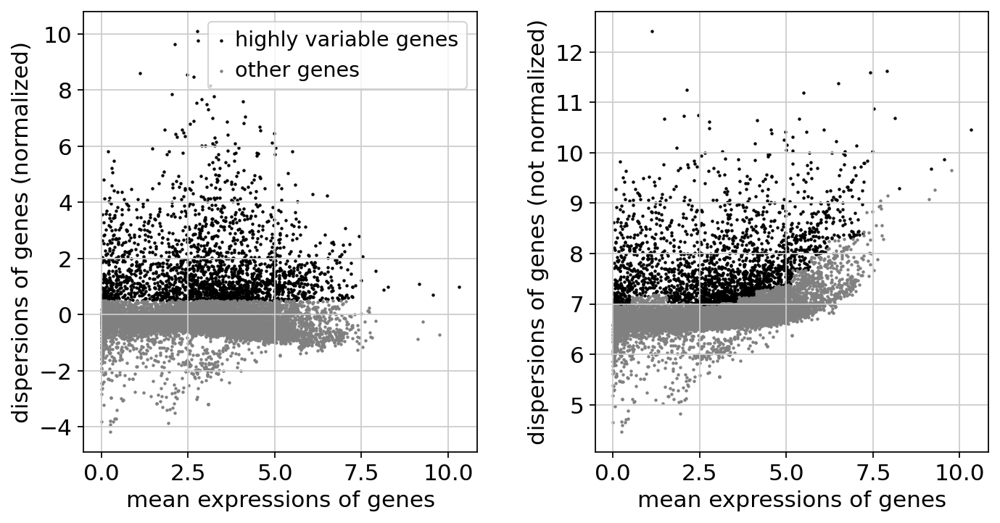

In [69]:
sc.pl.highly_variable_genes(fdata)

In [70]:
sc.tl.pca(fdata, svd_solver ='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)


/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


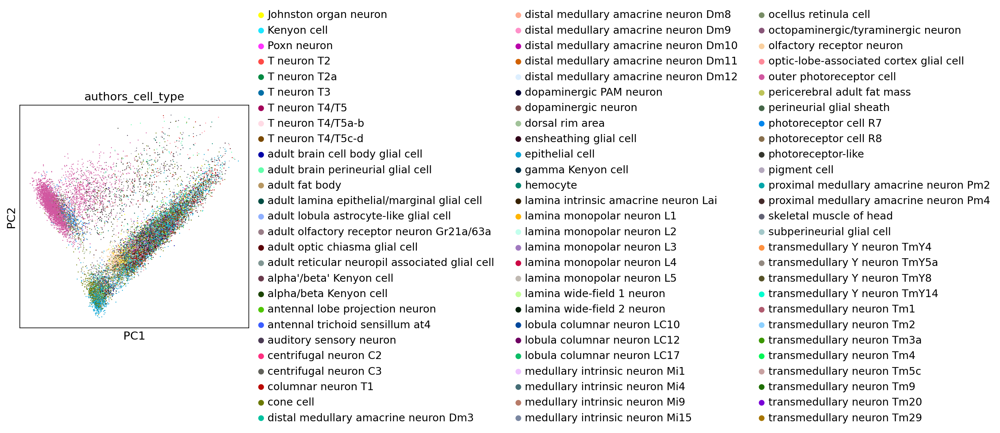

In [71]:
sc.pl.pca(fdata, color = 'authors_cell_type')

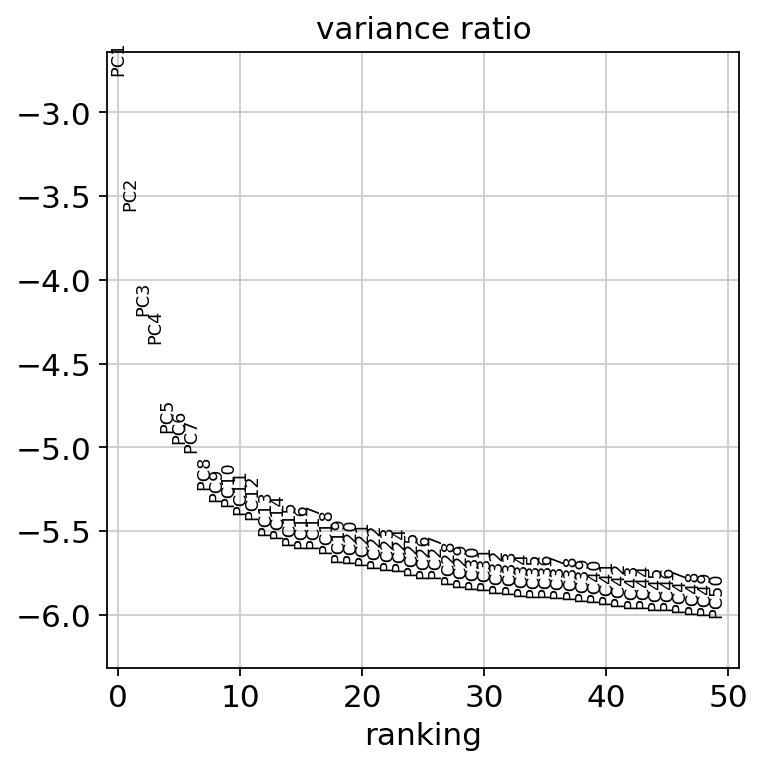

In [82]:
sc.pl.pca_variance_ratio(fdata, log=True, n_pcs = 50)

In [83]:
sc.pp.neighbors(fdata)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:18)


In [84]:
sc.tl.umap(fdata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:18)


/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


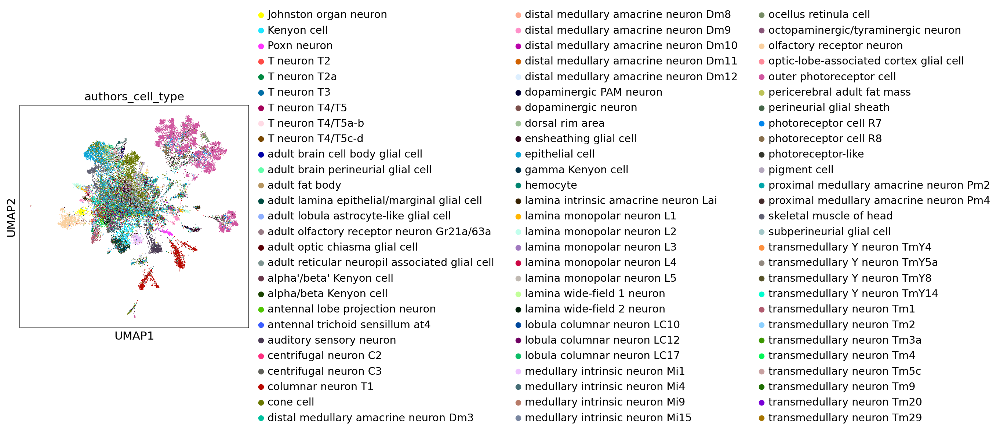

In [85]:
sc.pl.umap(fdata, color = 'authors_cell_type')

/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


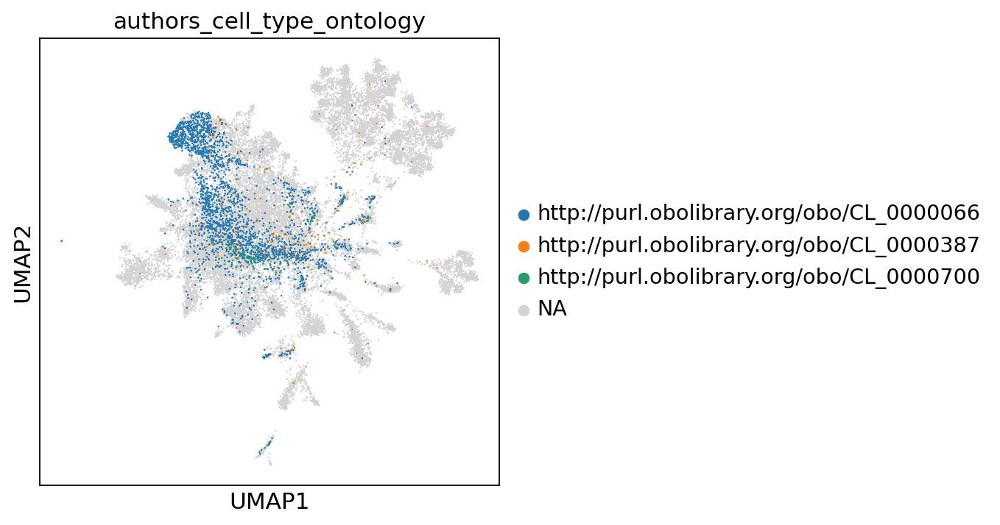

In [86]:
sc.pl.umap(fdata, color = 'authors_cell_type_ontology')

/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


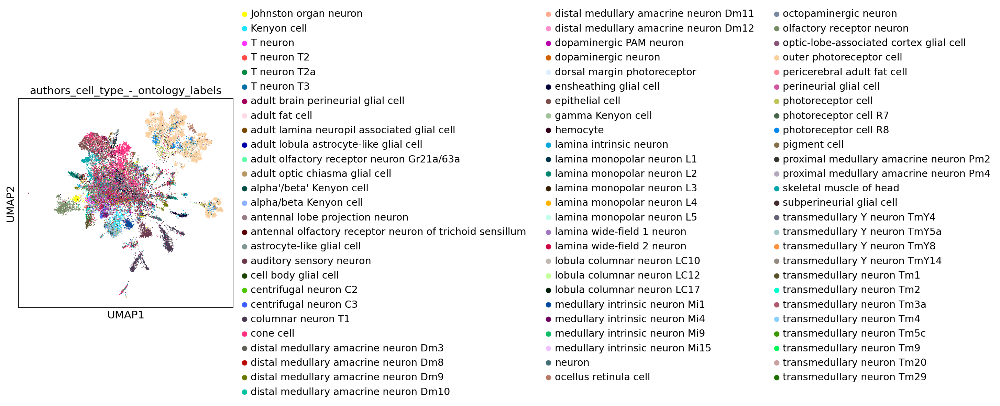

In [87]:
sc.pl.umap(fdata, color = 'authors_cell_type_-_ontology_labels')

/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


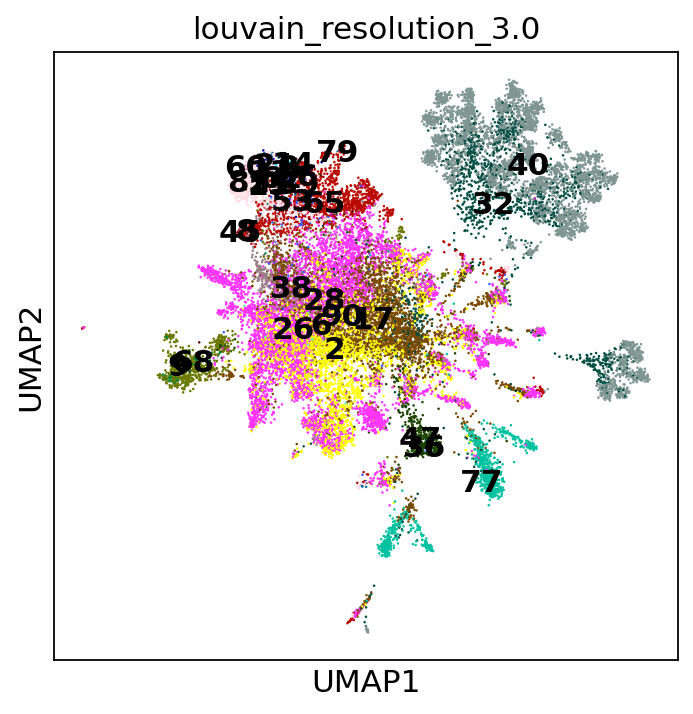

In [88]:
sc.pl.umap(fdata, color = 'louvain_resolution_3.0', legend_loc = 'on data')

In [89]:
sc.tl.leiden(fdata)

running Leiden clustering
    finished: found 39 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:03)


/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


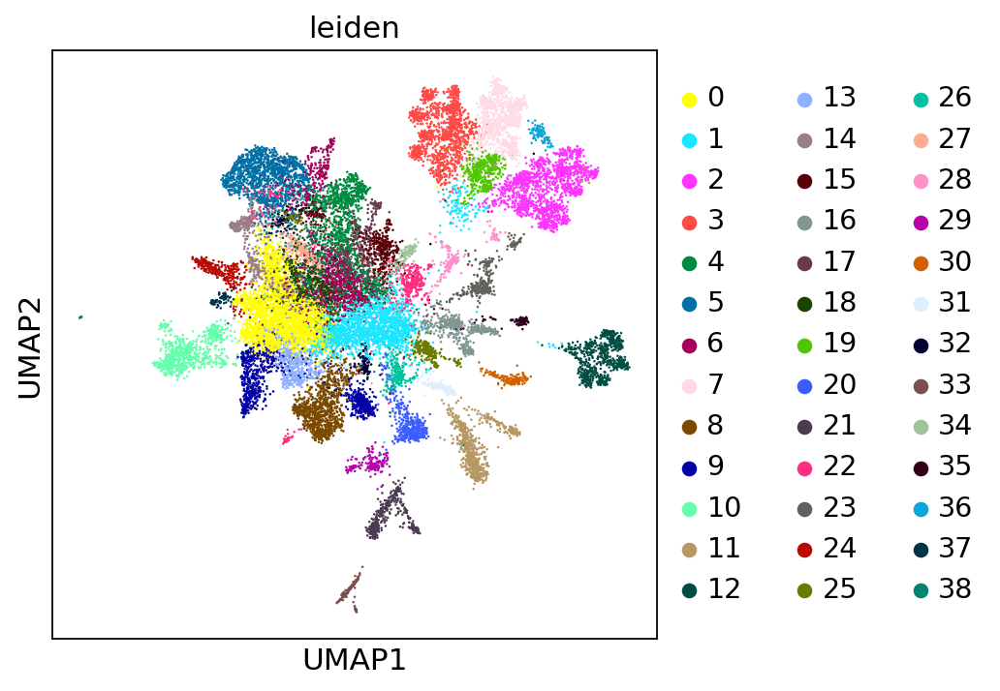

In [90]:
sc.pl.umap(fdata, color = 'leiden')

/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


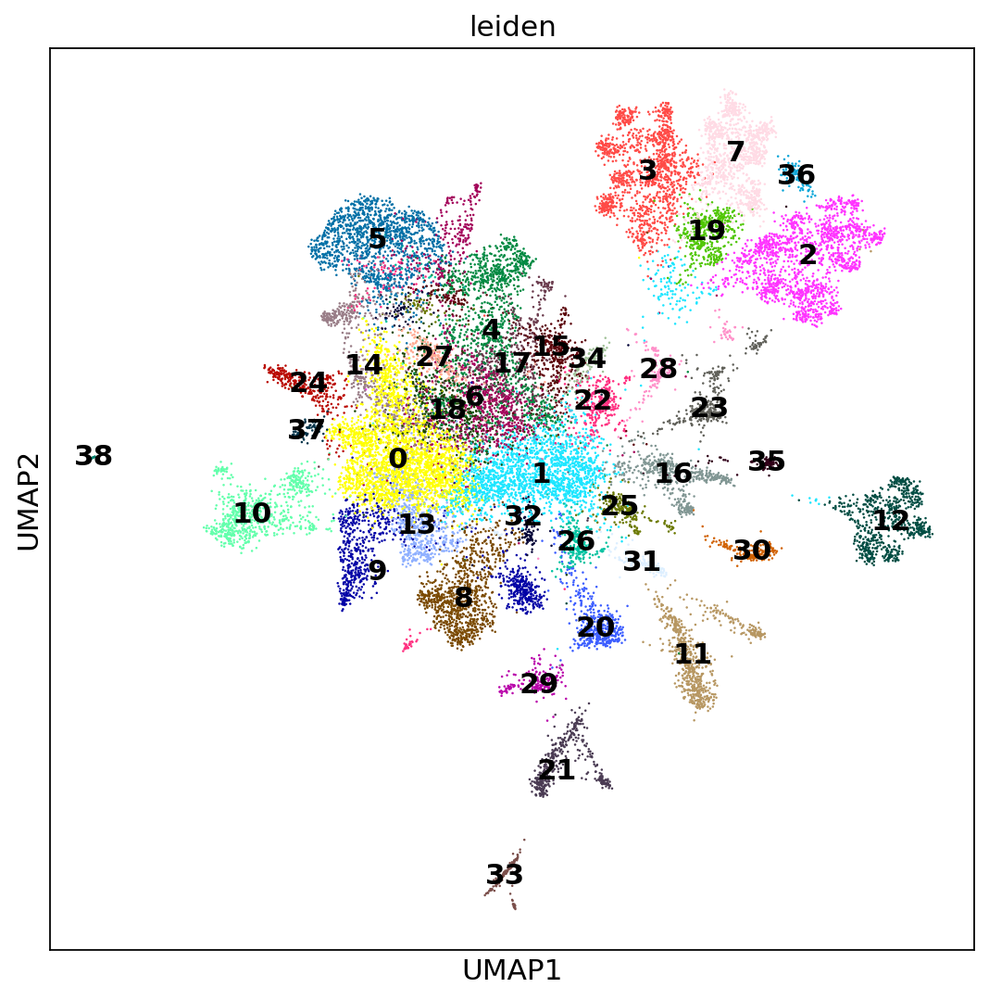

In [91]:
sc.settings.set_figure_params(dpi=80, facecolor='white', figsize = (8,8))
sc.pl.umap(fdata, color = 'leiden', legend_loc = 'on data')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:24)


/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:

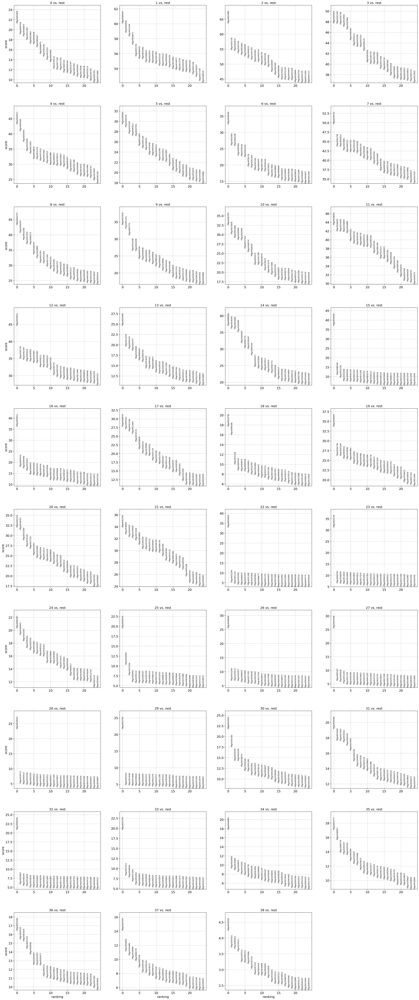

In [92]:
sc.tl.rank_genes_groups(fdata, 'leiden', method = 'wilcoxon')
sc.pl.rank_genes_groups(fdata, n_genes = 25, sharey = False)

/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


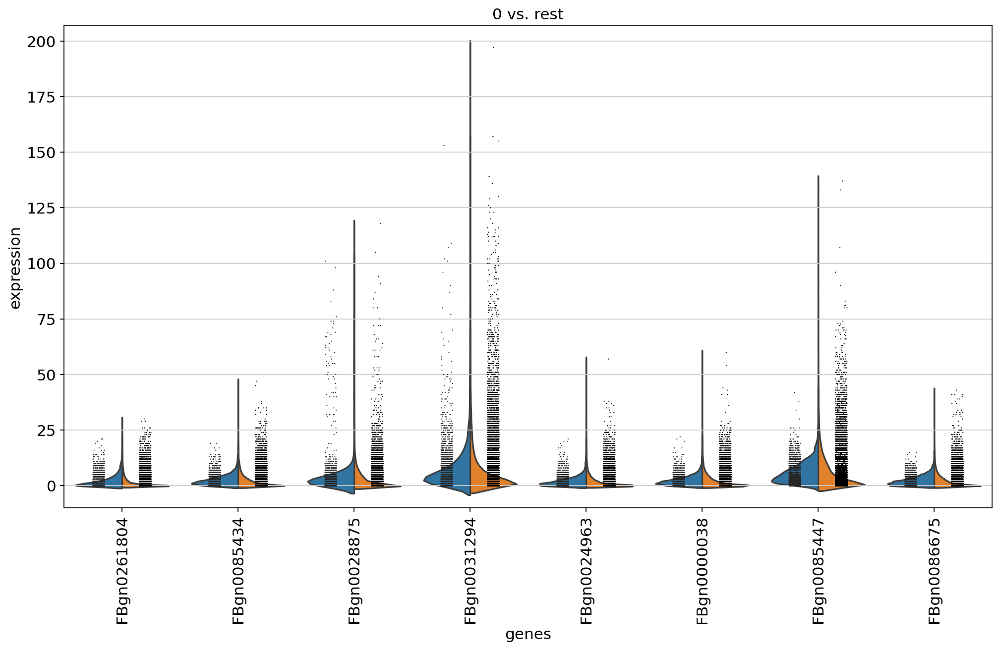

/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


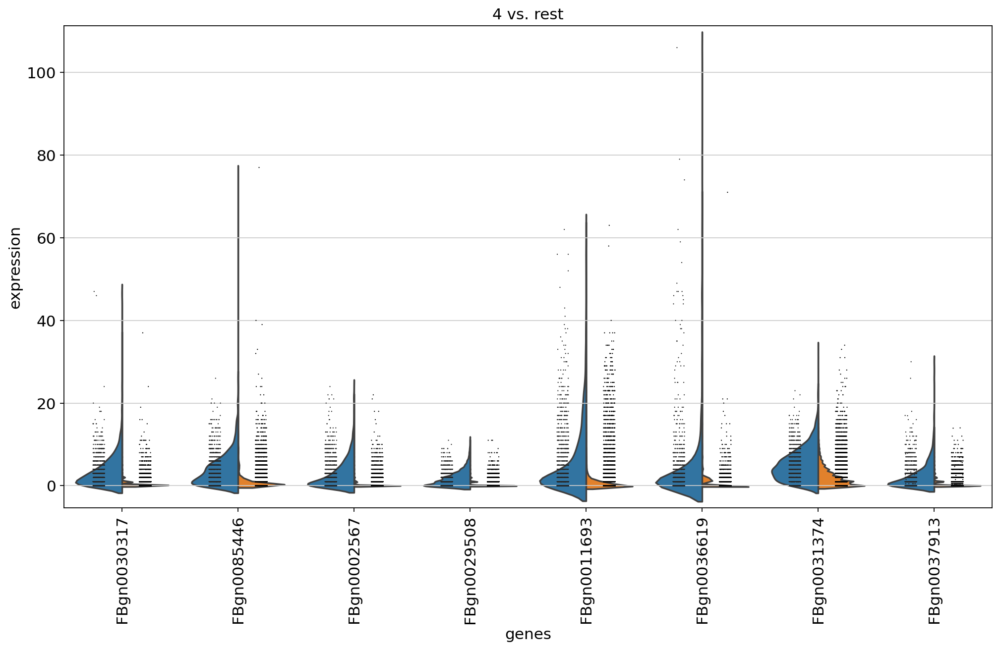

/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


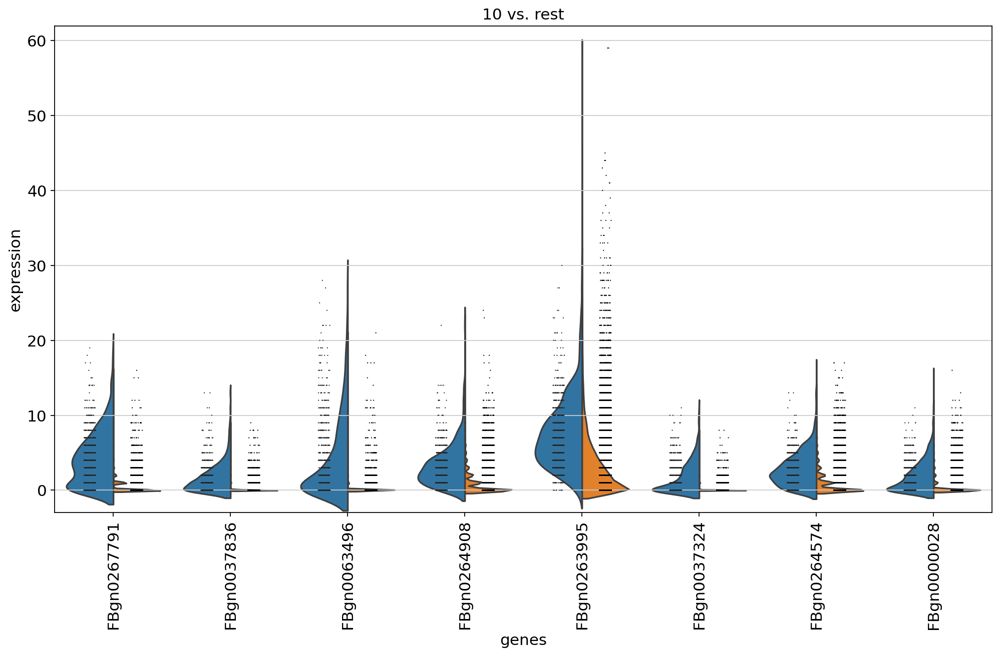

/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


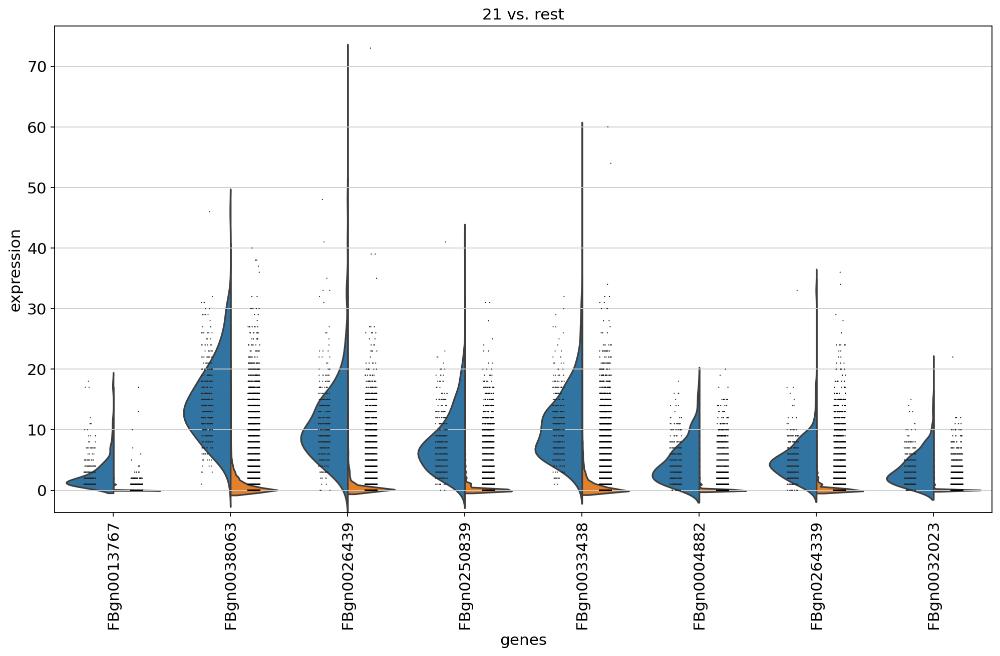

/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


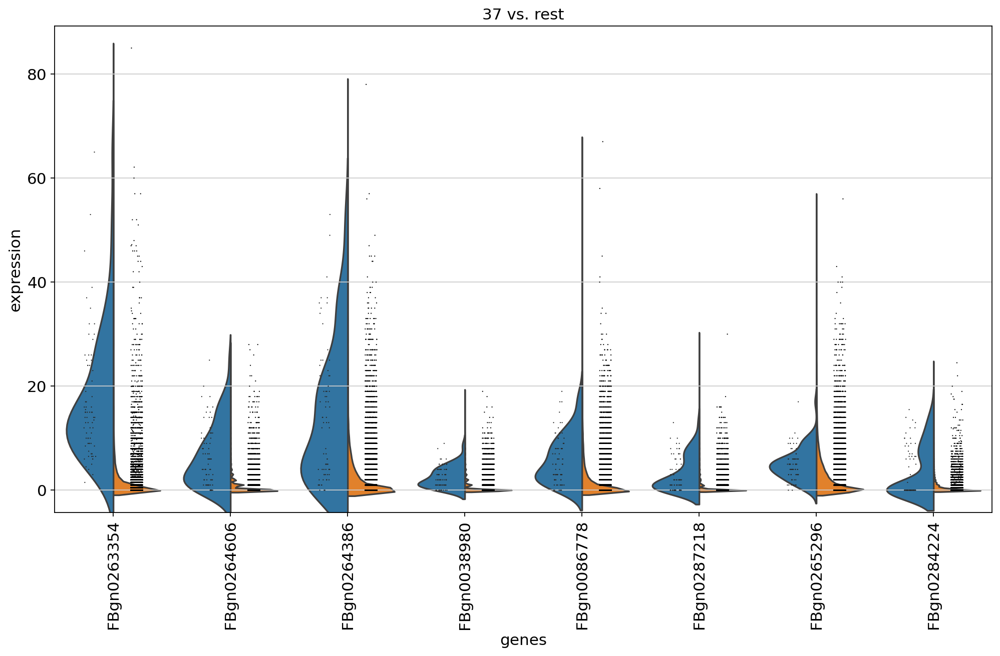

In [94]:
sc.settings.set_figure_params(dpi=80, facecolor='white', figsize = (15,8))
sc.pl.rank_genes_groups_violin(fdata, groups = ['0','4','10','21','37'], n_genes = 8)

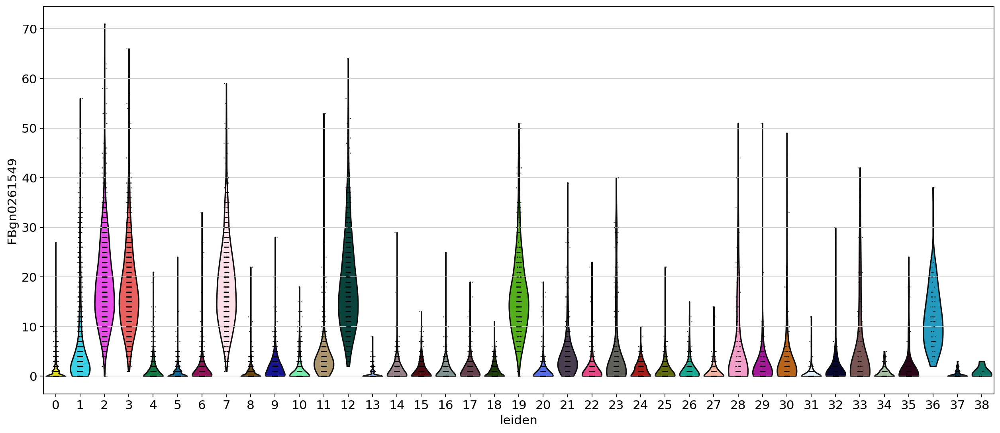

In [95]:
sc.pl.violin(fdata, ['FBgn0261549'], groupby = 'leiden')

/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


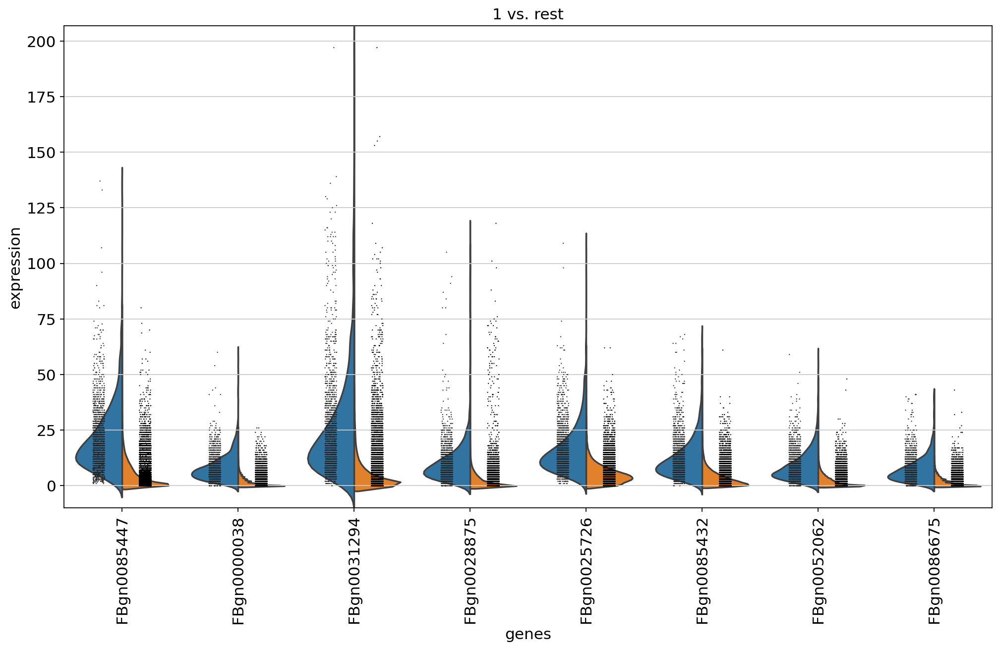

In [96]:
sc.pl.rank_genes_groups_violin(fdata, groups='1', n_genes=8)

# Write the results

In [97]:
## Writes the highly variable genes in a csv file
# assuming that the anndata object is already loaded and analyzed using scanpy

# define the path where the CSV file will be saved

def write_marker_genes(adata, csv_path, pval_adj_cutoff=0.05):

    # get the rank_genes_groups object from adata.uns
    rank_genes_groups = adata.uns['rank_genes_groups']

    # create an empty dataframe to store the results
    results_df = pd.DataFrame()

    # loop through the cell types
    for ct in rank_genes_groups['names'].dtype.names:
        # create a dataframe with the marker genes for the current cell type
        ct_df = pd.DataFrame({
            'gene': rank_genes_groups['names'][ct],
            'score': rank_genes_groups['scores'][ct],
            'logfoldchanges': rank_genes_groups['logfoldchanges'][ct],
            'pvals': rank_genes_groups['pvals'][ct],
            'pvals_adj': rank_genes_groups['pvals_adj'][ct]
        })
        # add a column to indicate the cell type
        ct_df['cell_type'] = ct
        # append the results for the current cell type to the overall results dataframe
        results_df = pd.concat([results_df, ct_df], ignore_index=True)

    # save the results dataframe to a CSV file
    
    
    results_df.loc[results_df['pvals_adj'] < pval_adj_cutoff].to_csv(csv_path, index=False)

In [98]:
csv_path = os.path.dirname(os.path.realpath('fly_data.ipynb'))
csv_path = csv_path + '/fly_hvg_'+str(date.today())+'.csv'
csv_path

'/nfs/research/irene/anaelle/data/fly/fly_hvg_2023-06-01.csv'

In [99]:
write_marker_genes(fdata,csv_path)

In [104]:
raw_counts = fdata.layers['raw_counts']

In [105]:
raw_counts

matrix([[0., 0., 2., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [106]:
del fdata.layers['raw_counts']

In [107]:
fdata.write_h5ad('fdata.h5ad',compression='gzip')

In [108]:
fdata.layers['raw_counts'] = raw_counts

In [113]:
fdata.layers['raw_counts']

matrix([[0., 0., 2., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)